In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

from ParallelSolve import gurobi_SSKP, majority_vote

In [2]:
# generate random variables by name
# note that for pareto distribution, we only modify the shape parameter
def sample_func(distribution_name, **dist_params):
     if hasattr(np.random, distribution_name):
        dist_func = getattr(np.random, distribution_name)
        samples = dist_func(**dist_params)
        return samples + 1 if distribution_name == "pareto" else samples
     else:
        raise ValueError(f"Unsupported distribution: {distribution_name}")

In [3]:
# function that evaluates the objective function of SSKP using a large number of samples
def optimal_eval(sample, x, r, c, q):
     # sample: large number * m matrix
     expected_cost = 0
     for w in sample:
          expected_cost += max(sum(w[i] * x[i] for i in range(len(x)))-q, 0)
     expected_cost = expected_cost/len(sample)
     opt = sum(r[i] * x[i] for i in range(len(x))) - c * expected_cost
     return opt

In [6]:
# functions that implements the comparison between SAA and Bagging-SAA, as well as evaluating the results
# assuming the random variables are Pareto distributed
def comparison(m,r,c,q,a_ls,B,number_of_iterations,ratio,sample_number):
    # output: two lists of solutions for SAA and Bagging-SAA, respectively
    # input:
    # a_ls: parameter list of the Pareto distribution
    # B: batch size
    # number_of_iterations: number of repeated evaluations
    # ratio: proportion of samples used in Bagging-SAA
    # sample_number: list of sample sizes
    SAA_list = []
    majority_list = []
    for n in sample_number:
        SAA_intermediate = []
        majority_intermediate = []
        for j in range(number_of_iterations):
            arrays_list = []
            for i in range(m):
                arrays_list.append(sample_func('pareto', size=n, a=a_ls[i]))
            sample_n = np.vstack(arrays_list).T 
            SAA = majority_vote(sample_n, 1, n, gurobi_SSKP, r,c,q)
            SAA_intermediate.append(SAA)

            majority = majority_vote(sample_n, B, int(n*ratio), gurobi_SSKP, r,c,q)
            majority_intermediate.append(majority)
            print("finish ", n, j)
            
        SAA_list.append(SAA_intermediate)
        majority_list.append(majority_intermediate)
    return SAA_list, majority_list

def evaluation(SAA_list, majority_list, m, r, c, q, a_ls, number_of_iterations, sample_number, large_number_sample):
    # output: two lists of objective values for SAA and Bagging-SAA, respectively
    arrays_list = []
    for i in range(m):
        arrays_list.append(sample_func('pareto', size=large_number_sample, a=a_ls[i]))
    large_sample = np.vstack(arrays_list).T

    SAA_obj_list = []
    majority_obj_list = []
    for i in range(len(sample_number)):
        SAA_obj = 0
        majority_obj = 0
        for j in range(number_of_iterations):
            SAA_obj += optimal_eval(large_sample, SAA_list[i][j], r, c, q)
            majority_obj += optimal_eval(large_sample, majority_list[i][j], r, c, q)
            
        SAA_obj = SAA_obj/number_of_iterations 
        majority_obj = majority_obj/number_of_iterations 
        SAA_obj_list.append(SAA_obj)
        majority_obj_list.append(majority_obj)
    return SAA_obj_list, majority_obj_list

def figure_plot(SAA_obj_list, majority_obj_list,sample_number):
    # plot the objective values of SAA and Bagging-SAA
    _, ax = plt.subplots()
    ax.plot(sample_number, SAA_obj_list, marker = 'o', markeredgecolor = 'none', color = 'blue',linestyle = 'solid', linewidth = 2, label = 'SAA')
    ax.plot(sample_number, majority_obj_list, marker = 's', markeredgecolor = 'none', color = 'red',linestyle = 'solid', linewidth = 2, label = 'Majority Vote')
    ax.set_xlabel('Number of samples', size = 20)
    ax.set_ylabel('Objective', size = 20)
    ax.legend(loc = 'lower right')
    plt.show()
    return

In [7]:
# script for running a single instance for given parameters

import time

tic = time.time()

# Parameters setup 
m = 3 # Number of items
r = np.random.uniform(3, 4, size=m) # Rewards
c = 5 # Cost 
q = 2 # Budget
a_ls = np.random.uniform(1.9,2.1, size=m) # Parameters of Pareto distribution
B = 200 # Batch size
number_of_iterations = 10 # Number of repeated evaluations
ratio = 0.2 # Proportion of samples used in Bagging-SAA
sample_number = np.array([2**i for i in range(9, 17)])
large_number_sample = 1000000 # Number of large samples used in evaluation

SAA_list, majority_list = comparison(m,r,c,q,a_ls,B,number_of_iterations,ratio,sample_number)
SAA_obj_list, majority_obj_list = evaluation(SAA_list, majority_list, m, r, c, q, a_ls, number_of_iterations, sample_number, large_number_sample)
figure_plot(SAA_obj_list, majority_obj_list,sample_number)

print(f"time = {time.time() - tic} secs")

Set parameter Username


Process Process-2:
Traceback (most recent call last):
  File "/Users/mickey/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/mickey/opt/anaconda3/lib/python3.9/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/mickey/Documents/ResearchProject/BaggedSAA/code/sskp.py", line 38, in sequentialSolve
    x_k = tuple(eval_func(sample, *eval_args))
  File "/Users/mickey/Documents/ResearchProject/BaggedSAA/code/sskp.py", line 16, in gurobi_SSKP
    model = Model("SSKP")
  File "src/gurobipy/model.pxi", line 68, in gurobipy.Model.__init__
  File "src/gurobipy/gurobi.pxi", line 32, in gurobipy.gurobi._getdefaultenv
  File "src/gurobipy/env.pxi", line 62, in gurobipy.Env.__init__
gurobipy.GurobiError: License expired 2023-07-13


ValueError: max() arg is an empty sequence

In [116]:
# script to find good parameters for display
def find_parameters(m, a_ls, B,number_of_iterations,ratio,sample_number, large_number_sample):
    parameter_list = []
    SAA_list_test = []
    majority_list_test = []
    SAA_obj_list_test = []
    majority_obj_list_test = []
    prop_best = 0

    for _ in range(10):
        r = np.random.uniform(3, 4, size=m)
        c = float(np.random.uniform(3, 4, size=1)[0])
        q = float(np.random.uniform(0, 2, size=1)[0])
        
        SAA_list, majority_list = comparison(m,r,c,q,a_ls,B,number_of_iterations,ratio,sample_number)
        SAA_obj_list, majority_obj_list = evaluation(SAA_list, majority_list, m, r, c, q, a_ls, number_of_iterations, sample_number, large_number_sample)

        prop = sum((majority_obj_list[i] - SAA_obj_list[i])/majority_obj_list[i] for i in range(len(sample_number)//2,len(sample_number)))
        if prop > prop_best:
            prop_best = prop
            parameter_list = [r,c,q]
            SAA_list_test = SAA_list
            majority_list_test = majority_list
            SAA_obj_list_test = SAA_obj_list
            majority_obj_list_test = majority_obj_list
            
    return parameter_list, SAA_list_test, majority_list_test, SAA_obj_list_test, majority_obj_list_test
        

In [117]:
m = 3 # Number of items
a_ls = np.random.uniform(1.9,2.1, size=m) # Parameters of Pareto distribution
B = 400 # Batch size
number_of_iterations = 10 # Number of repeated evaluations
ratio = 0.1 # Proportion of samples used in Bagging-SAA
sample_number = np.array([2**i for i in range(9, 17)])
large_number_sample = 1000000 # Number of large samples used in evaluation
parameter_list, SAA_list_test, majority_list_test, SAA_obj_list_test, majority_obj_list_test = find_parameters(m, a_ls, B,number_of_iterations,ratio,sample_number, large_number_sample)


Interrupt request received
No optimal solution found.


TypeError: 'NoneType' object is not iterable

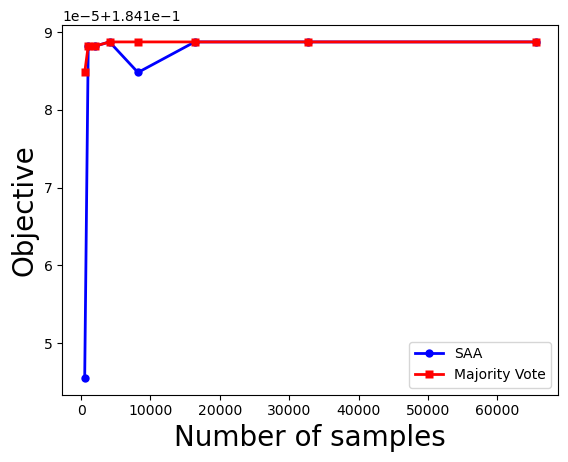

In [107]:
figure_plot(SAA_obj_list_test, majority_obj_list_test,sample_number)

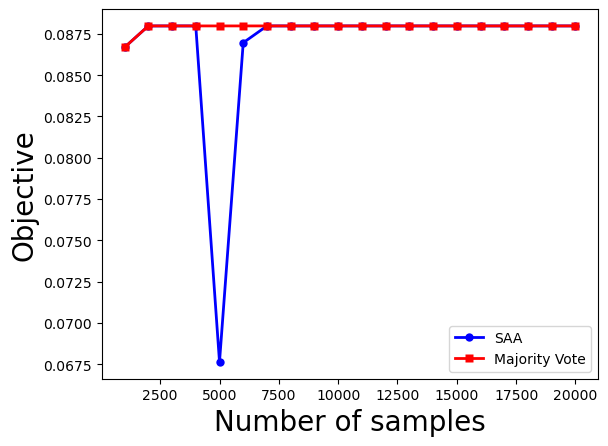

In [108]:
r, c, q = parameter_list
ratio = 0.2
B = 400
number_of_iterations = 20
sample_number = np.array([1000*i for i in range(1, 21)])

SAA_list, majority_list = comparison(m,r,c,q,a_ls,B,number_of_iterations,ratio,sample_number)
SAA_obj_list, majority_obj_list = evaluation(SAA_list, majority_list, m, r, c, q, a_ls, number_of_iterations, sample_number, large_number_sample)
figure_plot(SAA_obj_list, majority_obj_list,sample_number)

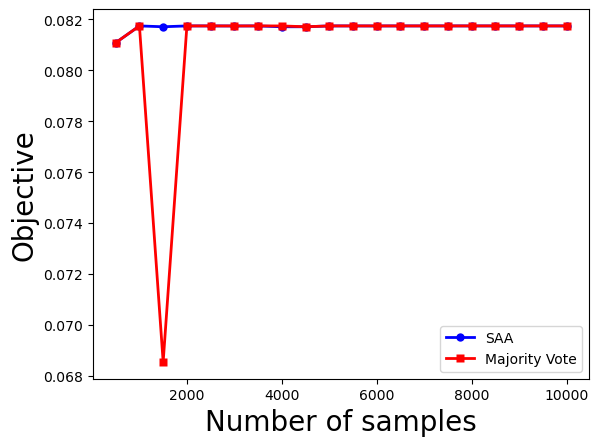

In [103]:
sample_number = np.array([500*i for i in range(1, 21)])

SAA_list, majority_list = comparison(m,r,c,q,a_ls,B,number_of_iterations,ratio,sample_number)
SAA_obj_list, majority_obj_list = evaluation(SAA_list, majority_list, m, r, c, q, a_ls, number_of_iterations, sample_number, large_number_sample)
figure_plot(SAA_obj_list, majority_obj_list,sample_number)

In [105]:
# one previous good parameter
parameter_list, a_ls

([array([3.2552501 , 3.21846121, 3.63506047]),
  3.0716201853681633,
  1.5376107914040915],
 array([2.01152699, 1.91321897, 1.97084946]))

In [109]:
# potentially good parameter
parameter_list, a_ls, B, number_of_iterations, ratio, sample_number, large_number_sample

([array([3.88628467, 3.57813177, 3.10152323]),
  3.9088401110638724,
  1.8930703843861516],
 array([1.95163007, 1.90175767, 2.07128249]),
 400,
 20,
 0.2,
 array([ 1000,  2000,  3000,  4000,  5000,  6000,  7000,  8000,  9000,
        10000, 11000, 12000, 13000, 14000, 15000, 16000, 17000, 18000,
        19000, 20000]),
 1000000)

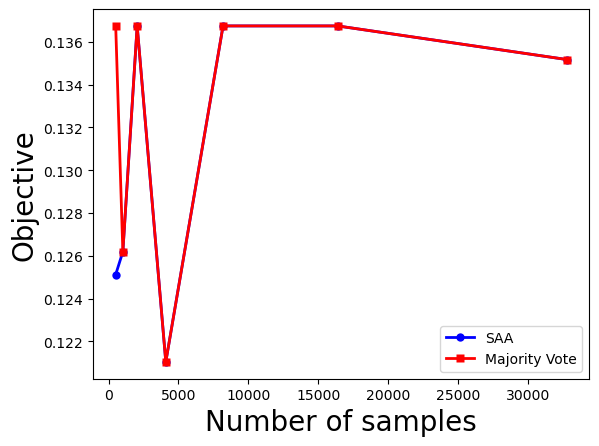

In [99]:
r,c,q = parameter_list
SAA_list, majority_list = comparison(m,r,c,q,a_ls,B,number_of_iterations,ratio,sample_number)
SAA_obj_list, majority_obj_list = evaluation(SAA_list, majority_list, m, r, c, q, a_ls, number_of_iterations, sample_number, large_number_sample)
figure_plot(SAA_obj_list, majority_obj_list,sample_number)

In [69]:
# previous code
# Testing: SAA and majority vote comparison - parameters setup

sample_number = np.array([2**i for i in range(10, 16)])
number_of_iterations = 3 # Number of iterations for each sample size (use to take average)
m = 3 # Number of items

# Generate samples for evaluation of optimal SAA and majority vote
large_number_sample = 1000
a_ls = np.full(m, 2) #np.random.rand(m)+1 # Pareto distribution parameter
arrays_list = []
for i in range(m):
    arrays_list.append(sample_func('pareto', size=large_number_sample, a=a_ls[i]))
larger_sample = np.vstack(arrays_list).T

parameter_list = []
SAA_list_test = []
majority_list_test = []
SAA_obj_list_test = []
majority_obj_list_test = []

for num_test in range(3):
    c = float(np.random.uniform(3, 4, size=1)[0]) # Cost 
    q = float(np.random.uniform(0, 2, size=1)[0]) # Budget
    r = np.random.uniform(3, 4, size=m) # Rewards
    
    SAA_obj = 0
    majority_obj = 0
    flag = 0
    SAA_obj_intermediate = []
    majority_obj_intermediate = []
    
    for n in sample_number:
        # SAA_intermediate = []
        # majority_intermediate = []
        
        for j in range(number_of_iterations):
            arrays_list = []
            for i in range(m):
                arrays_list.append(sample_func('pareto', size=n, a=a_ls[i]))
                sample_n = np.vstack(arrays_list).T
            SAA = majority_vote(sample_n, 1, n, gurobi_SSKP, r,c,q)
            # SAA_intermediate.append(SAA)
            SAA_obj += optimal_eval(larger_sample, SAA, r, c, q)

            majority = majority_vote(sample_n, 300, int(n/10), gurobi_SSKP, r,c,q)
            # majority_intermediate.append(majority)
            majority_obj += optimal_eval(larger_sample, majority, r, c, q)

        SAA_obj = SAA_obj/number_of_iterations
        majority_obj = majority_obj/number_of_iterations
        SAA_obj_intermediate.append(SAA_obj)
        majority_obj_intermediate.append(majority_obj)

        if SAA_obj >= majority_obj:
            flag = 1
            break
        
    if flag == 1:
        continue 
    
    parameter_list.append([m, c, q, r])
    SAA_obj_list_test.append(SAA_obj_intermediate)
    majority_obj_list_test.append(majority_obj_intermediate)

Gurobi Optimizer version 11.0.0 build v11.0.0rc2 (mac64[arm] - Darwin 21.3.0 21D62)

CPU model: Apple M1 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 1024 rows, 1027 columns and 4096 nonzeros
Model fingerprint: 0xfaade84b
Variable types: 1024 continuous, 3 integer (3 binary)
Coefficient statistics:
  Matrix range     [1e-04, 3e+01]
  Objective range  [3e-03, 4e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [3e-01, 3e-01]
Found heuristic solution: objective -0.0000000
Found heuristic solution: objective 2.3462801
Presolve removed 1024 rows and 1027 columns
Presolve time: 0.00s
Presolve: All rows and columns removed

Explored 0 nodes (0 simplex iterations) in 0.00 seconds (0.00 work units)
Thread count was 1 (of 10 available processors)

Solution count 3: 2.34628 2.34628 -0 
No other solutions better than 2.34628

Optimal solution found (tolerance 1.00e-04)
Best objective 2.346280149427e+00, best bound 2.346280149427

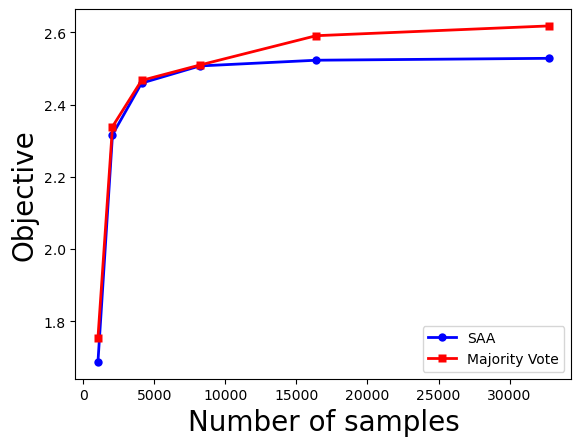

In [71]:
fig2, ax2 = plt.subplots()
ax2.plot(sample_number, SAA_obj_list_test[0], marker = 'o', markeredgecolor = 'none', color = 'blue',linestyle = 'solid', linewidth = 2, label = 'SAA')
ax2.plot(sample_number, majority_obj_list_test[0], marker = 's', markeredgecolor = 'none', color = 'red',linestyle = 'solid', linewidth = 2, label = 'Majority Vote')
ax2.set_xlabel('Number of samples', size = 20)
ax2.set_ylabel('Objective', size = 20)
ax2.legend(loc = 'lower right')
plt.show()

In [4]:
# previous code based on normal distribution
# normal distribution comparison between SAA and majority vote
def u(x, u, q):
    return sum(u_i * x_i for u_i, x_i in zip(u, x)) - q

def var(x,std):
    return sum(std_i**2 * x_i**2 for std_i, x_i in zip(std, x))

def phi(x):
    return stats.norm.cdf(x, loc=0, scale=1)

def g(x, r, c, q, avg, std):
    expect_obj = sum(r_i * x_i for r_i, x_i in zip(r, x)) \
        - c * (u(x,avg,q) * phi(u(x,avg,q)/np.sqrt(var(x,std))) \
               + np.sqrt(var(x,std)/(2*np.pi)) * np.exp(-u(x,avg,q)**2/(2*var(x,std))))
    return expect_obj

m = 3 # Number of items
c = 5 # Cost 
q = 10 # Budget
r = np.random.uniform(3, 4, size=m) # Rewards

# generate n samples with iid normal distribution
avg =  np.random.randint(1, 5, size=m)
std =  np.random.randint(10, 20, size=m)


SAA_list_normal = []
SAA_obj_list_normal = []
majority_list_normal = []
majority_obj_list_normal = []
sample_number = np.arange(20, 1050, 50)
for ite in sample_number:
    arrays_list = []
    n = ite
    for i in range(m):
        arrays_list.append(sample_func('normal', size=n, loc=avg[i], scale=std[i]))
    sample_n = np.vstack(arrays_list).T
    SAA = majority_vote(sample_n, 1, n, gurobi_SSKP, r,c,q)
    SAA_list_normal.append(SAA)
    SAA_obj = g(SAA, r, c, q, avg, std)
    SAA_obj_list_normal.append(SAA_obj)

    majority = majority_vote(sample_n, 40, int(n/10), gurobi_SSKP, r,c,q)
    majority_list_normal.append(majority)
    majority_obj = g(majority, r, c, q, avg, std)
    majority_obj_list_normal.append(majority_obj)

fig1, ax1 = plt.subplots()
ax1.plot(sample_number, SAA_obj_list_normal, marker = 'o', markeredgecolor = 'none', color = 'blue',linestyle = 'solid', linewidth = 2, label = 'SAA')
ax1.plot(sample_number, majority_obj_list_normal, marker = 's', markeredgecolor = 'none', color = 'red',linestyle = 'solid', linewidth = 2, label = 'Majority Vote')
ax1.set_xlabel('Number of samples', size = 20)
ax1.set_ylabel('Objective', size = 20)
ax1.legend(loc = 'lower right')
plt.show()

NameError: name 'np' is not defined